# Scaling, Performance, and Memory

In this notebook we will work with a multi-machine cluster operating in the cloud.  We will do performance tuning on a workflow that enables interactive visualization, and learn about how to measure and improve performance in a distributed context.  We'll make some pretty images too.


## Request Dask Cluster

There are many services to create Dask clusters in the cloud.  Today we'll use Coiled.

In [2]:
import coiled

In [3]:
cluster = coiled.Cluster(
    name="datashader",
    n_workers=20,
    package_sync=True,
)

from dask.distributed import Client
client = Client(cluster)

client

╭───────────────────────────────────────── Package Issues ─────────────────────────────────────────╮
│                      ╷                                                          ╷                │
│   Package            │ Issue                                                    │ Risk Level     │
│ ╶────────────────────┼──────────────────────────────────────────────────────────┼──────────────╴ │
│   libgfortran5       │ 11.3.0 has no install candidate for linux-64             │                │
│   libgfortran        │ 5.0.0 has no install candidate for linux-64              │                │
│   grpcio             │ 1.46.3 has no install candidate for linux-64             │                │
│   grpc-cpp           │ 1.46.3 has no install candidate for linux-64             │                │
│   arrow-cpp          │ 8.0.0 has no install candidate for linux-64              │                │
│   openssl            │ Package ignored                                          │                │
│   coiled-runtime     │ Package ignored                                          │                │
│   abseil-cpp         │ Package ignored                                          │                │
│                      ╵                                                          ╵                │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯

Output()

/Users/rpelgrim/mambaforge/envs/datashader/lib/python3.10/site-packages/distributed/client.py:1274: VersionMismatchWarning: Mismatched versions found

+---------+--------+-----------+---------+
| Package | client | scheduler | workers |
+---------+--------+-----------+---------+
| lz4     | 4.0.0  | 4.0.2     | 4.0.2   |
+---------+--------+-----------+---------+
  warnings.warn(version_module.VersionMismatchWarning(msg[0]["warning"]))


<Client: 'tls://10.0.2.173:8786' processes=20 threads=80, memory=298.62 GiB>

## Large Scale GIS Visualization

For our application we'll visualize the taxi pickup locations in the classic NYC Taxi dataset.  

This data is available to us in Parquet format on S3

### Data

In [3]:
# Read in one year of NYC Taxi data

import dask.dataframe as dd

df = dd.read_parquet(
    "s3://coiled-datasets/dask-book/nyc-tlc/2009"
)
df.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,mta_tax,tip_amount,tolls_amount,total_amount
0,VTS,2009-01-04 02:52:00,2009-01-04 03:02:00,1,2.63,-73.991957,40.721567,NaN,None,-73.993803,40.695922,CASH,8.9,0.5,NaN,0.00,0.0,9.40
1,VTS,2009-01-04 03:31:00,2009-01-04 03:38:00,3,4.55,-73.982102,40.736290,NaN,None,-73.955850,40.768030,Credit,12.1,0.5,NaN,2.00,0.0,14.60
2,VTS,2009-01-03 15:43:00,2009-01-03 15:57:00,5,10.35,-74.002587,40.739748,NaN,None,-73.869983,40.770225,Credit,23.7,0.0,NaN,4.74,0.0,28.44
3,DDS,2009-01-01 20:52:58,2009-01-01 21:14:00,1,5.00,-73.974267,40.790955,NaN,None,-73.996558,40.731849,CREDIT,14.9,0.5,NaN,3.05,0.0,18.45
4,DDS,2009-01-24 16:18:23,2009-01-24 16:24:56,1,0.40,-74.001580,40.719382,NaN,None,-74.008378,40.720350,CASH,3.7,0.0,NaN,0.00,0.0,3.70


In [4]:
len(df)

170896055

<img src="images/nyc-taxi-scatter.png" align="right" width="40%">

### Plotting large scale data is hard

Let's say we wanted to get a map of where taxi's dropped off passengers.  In principle we'd want something like the following:

```python
df.sample(frac=0.001).plot(
    x="pickup_longitude", 
    y="pickup_latitude", 
    kind="scatter",
)
```

Even at 0.1% downsampling this is still just a big blob of blue.

We can do better.

### Datashader for large scale visualization

[Datashader](https://datashader.org/) is a Python library designed to visualize large datasets.  It also happens to build on Dask.  It renders large volumes of data with better design.

We won't go into how Datashader works in this tutorial (there are excellent resources online) for us it's just a tool to show us that we're processing our data quickly.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
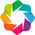

In [5]:
import datashader
from datashader import transfer_functions as tf
from datashader.colors import Greys9, Hot
import holoviews as hv
import numpy as np
from holoviews import opts
from holoviews.element.tiles import StamenTonerBackgroundRetina

hv.extension("bokeh")

Greys9_r = list(reversed(Greys9))[:-2]

CPU times: user 595 ms, sys: 178 ms, total: 773 ms
Wall time: 47.3 s


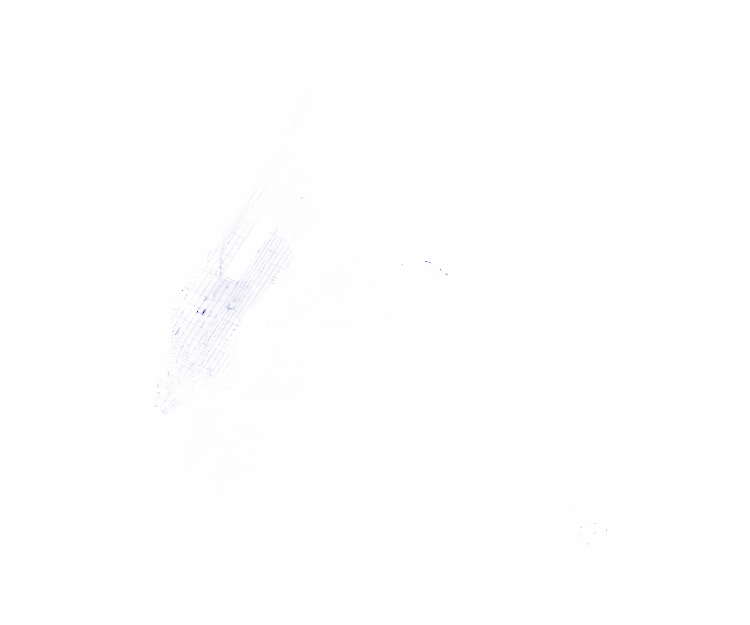

In [6]:
%%time

# Define plotting parameters
plot_width = int(750)
plot_height = int(plot_width // 1.2)
x_range, y_range = (-74.1, -73.7), (40.6, 40.9)
plot_options = hv.Options(width=plot_width, height=plot_height, xaxis=None, yaxis=None)

# Plot
canvas = datashader.Canvas(
    plot_width=plot_width, plot_height=plot_height, x_range=x_range, y_range=y_range
)
agg = canvas.points(
    df, "dropoff_longitude", "dropoff_latitude", datashader.count("passenger_count")
)
datashader.transfer_functions.shade(agg, cmap=["white", "darkblue"], how="linear")

Datashader plots can be finely customized. Let's try again with some different settings:

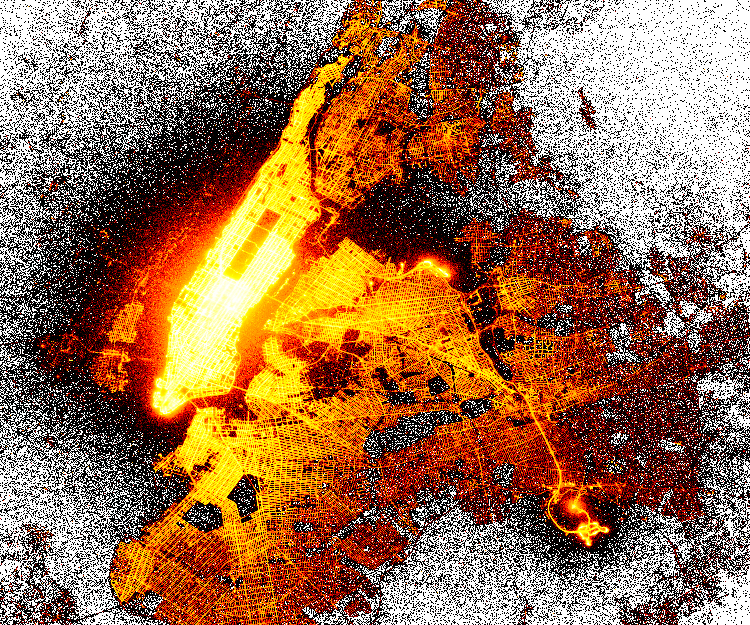

In [7]:
datashader.transfer_functions.shade(agg, cmap=Hot, how="eq_hist")

That looks nicer.

## Interactive

In [8]:
import hvplot.dask

In [7]:
df.hvplot.scatter(
    x="dropoff_longitude", 
    y="dropoff_latitude", 
    aggregator=datashader.count("passenger_count"), 
    datashade=True, 
    cnorm="eq_hist", 
    cmap=Hot
)

:DynamicMap   []
   :RGB   [dropoff_longitude,dropoff_latitude]   (R,G,B,A)

In [ ]:
# this works but is relatively slow

## Cleaning Up The Data
Something's off about this plot...where is the signature NYC street grid?

In [ ]:
# The narrative here doesn't flow quite right atm because the static Datashader image 
# we plotted above already limited the `x_range` and `y_range` variables 
# to get the NYC bounding box. I'd recommend re-inserting the interactive 
# plot here with the entire dataset here OR removing the `x_range` and 
#`y_range` variables from the `datashader.Canvas()` object if you want 
# to stay with static images.

In [9]:
df.dropoff_longitude.head()

0   -73.993803
1   -73.955850
2   -73.869983
3   -73.996558
4   -74.008378
Name: dropoff_longitude, dtype: float64

In [10]:
df.dropoff_longitude.max().compute() , df.dropoff_longitude.min().compute()

(1565.329797, -3509.015037)

Looks like there are some rows with bad location data in the mix. 

Let's filter those out and retry.

In [11]:
df = df.loc[
    (df.dropoff_longitude > -74.1 ) & (df.dropoff_longitude < -73.7) & 
    (df.dropoff_latitude > 40.6 ) & (df.dropoff_latitude < 40.9)
]

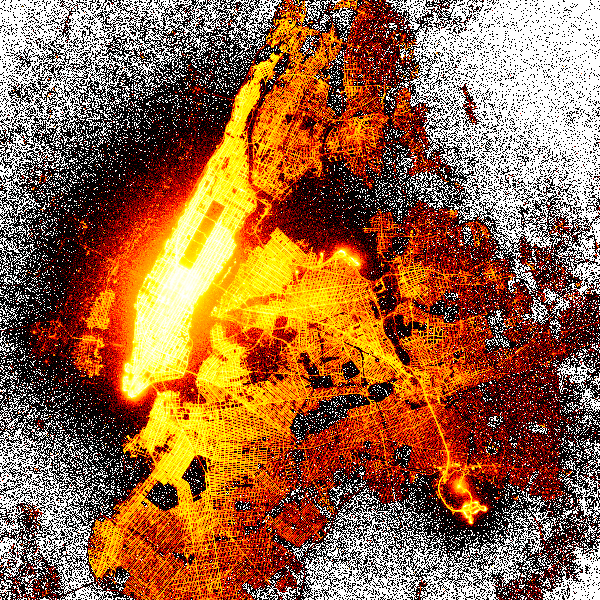

In [10]:
canvas = datashader.Canvas()
agg = canvas.points(
    df, "dropoff_longitude", "dropoff_latitude", datashader.count("passenger_count")
)
datashader.transfer_functions.shade(agg, cmap=Hot, how="eq_hist")

## Let's Speed This Up
That works...technically. But it's painfully slow to render. How can we speed this up?

One of the time-consuming tasks here is fetching the data from S3. We can `.persist()` the dataframe into our cluster memory before we render the interactive plot. That should speed things up a bit.

In [55]:
df = df.persist()

Let's try again:

In [12]:
df = df[["dropoff_longitude", "dropoff_latitude", "passenger_count"]].repartition(partition_size="256 MiB").persist()

CPU times: user 607 ms, sys: 34.2 ms, total: 641 ms
Wall time: 12.3 s


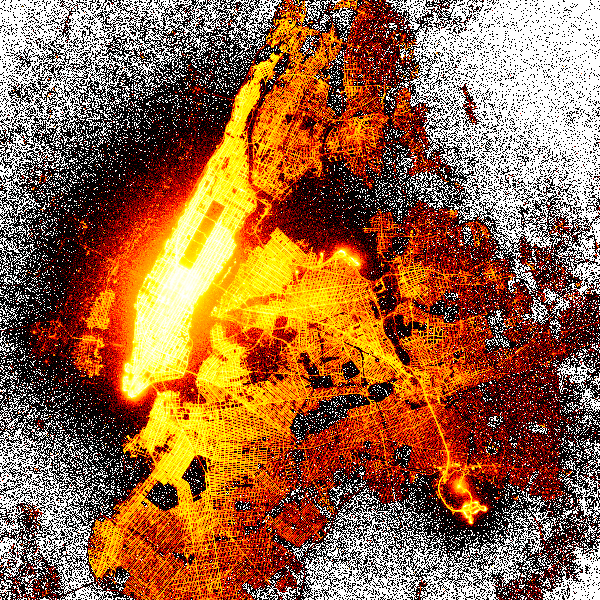

In [13]:
%%time

agg = datashader.Canvas().points(
    df, "dropoff_longitude", "dropoff_latitude", datashader.count("passenger_count")
)
datashader.transfer_functions.shade(agg, cmap=Hot, how="eq_hist")

In [13]:
df.hvplot.scatter(
    x="dropoff_longitude", 
    y="dropoff_latitude", 
    aggregator=datashader.count("passenger_count"), 
    datashade=True, 
    cnorm="eq_hist", 
    cmap=Hot
)

:DynamicMap   []
   :RGB   [dropoff_longitude,dropoff_latitude]   (R,G,B,A)

In [58]:
# this runs pretty great on a 10-worker cluster. 1-2s rendertime per zoom/pan.

## More Data!
You've shown this to your colleagues and they're impressed. But your manager sees opportunity and is curious how much more they can do with this! They point you to another bucket and ask you to visualize the data that's in there: 5 years' worth of NYC taxi data, totalling over 200GB in memory.

In [77]:
df = dd.read_parquet(
    "s3://coiled-datasets/dask-book/nyc-tlc/2009-2013/"
)

In [79]:
df.tail()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount
386659,VTS,2013-12-30 14:05:00,2013-12-30 14:32:00,6,13.77,-73.870990,40.773787,-73.992060,40.713267,CRD,38.0,0.0,8.67,5.33,52.5
386660,VTS,2013-12-31 17:23:00,2013-12-31 17:39:00,1,1.96,-73.975535,40.749672,-73.975638,40.759075,CRD,11.5,1.0,2.50,0.00,15.5
386661,VTS,2013-12-31 17:34:00,2013-12-31 17:48:00,1,2.28,-73.972590,40.780987,-73.972307,40.756672,CSH,11.5,1.0,0.00,0.00,13.0
386662,VTS,2013-12-31 08:48:00,2013-12-31 09:02:00,1,3.15,-73.952700,40.772227,-73.963217,40.803787,CRD,12.5,0.0,2.50,0.00,15.5
386663,VTS,2013-12-31 12:39:00,2013-12-31 13:03:00,1,6.09,-73.973575,40.791932,-74.009558,40.729750,CRD,22.0,0.0,4.40,0.00,26.9


You've just learned some neat tricks so decide to persist the data to cluster memory before plotting this one.

In [15]:
df = df.persist()

In [80]:
# select only nyc datapoints
df = df.loc[
    (df.dropoff_longitude > -74.1 ) & (df.dropoff_longitude < -73.7) & 
    (df.dropoff_latitude > 40.6 ) & (df.dropoff_latitude < 40.9)
]

In [ ]:
%%time

agg = datashader.Canvas().points(
    df, "dropoff_longitude", "dropoff_latitude", datashader.count("passenger_count")
)
datashader.transfer_functions.shade(agg, cmap=Hot, how="eq_hist")

In [23]:
client.restart()  # oof.  that was bad.

<Client: 'tls://10.0.4.127:8786' processes=10 threads=40, memory=149.31 GiB>

In [26]:
df.dtypes

vendor_id                    object
pickup_datetime      datetime64[ns]
dropoff_datetime     datetime64[ns]
passenger_count               int64
trip_distance               float64
pickup_longitude            float64
pickup_latitude             float64
dropoff_longitude           float64
dropoff_latitude            float64
payment_type                 object
fare_amount                 float64
surcharge                   float64
tip_amount                  float64
tolls_amount                float64
total_amount                float64
dtype: object

## Reduce dataset size in memory

In [31]:
# can't subset and then change dtypes
# i'm guessing this is residual code because you do this again later after trying the dtype changes
# df = df[["dropoff_latitude", "dropoff_longitude", "passenger_count"]]

In [33]:
dtypes = {
    "vendor_id": "string[pyarrow]",
    "passenger_count": "int16",
    "trip_distance": "float32",
    "pickup_latitude": "float32",
    "pickup_longitude": "float32",
    "payment_type": "string[pyarrow]",
    "fare_amount": "float32",
    "surcharge": "float32",
    "tip_amount": "float32",
    "tolls_amount": "float32",
    "total_amount": "float32",
}

In [34]:
df = df.astype(dtypes).persist()

In [63]:
client.restart()

<Client: 'tls://10.0.12.241:8786' processes=10 threads=40, memory=149.32 GiB>

In [37]:
df.memory_usage(deep=True).sum().compute()

201756473139

In [38]:
_ / 1e9

201.756473139

In [81]:
df = df[["dropoff_longitude", "dropoff_latitude", "passenger_count"]]

In [82]:
# subset to get right locations again
# select only nyc datapoints
df = df.loc[
    (df.dropoff_longitude > -74.1 ) & (df.dropoff_longitude < -73.7) & 
    (df.dropoff_latitude > 40.6 ) & (df.dropoff_latitude < 40.9)
]

In [83]:
df = df.repartition(partition_size="100 MiB").persist()

In [84]:
len(df)

847568953

In [42]:
cvs.points?

Object `cvs.points` not found.


In [ ]:
%%time

agg = datashader.Canvas().points(
    source=df, 
    x="dropoff_longitude", 
    y="dropoff_latitude", 
    agg=datashader.count("passenger_count")
)

tf.shade(agg, cmap=Hot, how="eq_hist")

In [69]:
df.hvplot.scatter(
    x="dropoff_longitude", 
    y="dropoff_latitude", 
    aggregator=datashader.count("passenger_count"), 
    datashade=True, 
    cnorm="eq_hist", 
    cmap=Hot
)

:DynamicMap   []
   :RGB   [dropoff_longitude,dropoff_latitude]   (R,G,B,A)

In [70]:
# this is slower again because we have lots more data. 
# let's scale the cluster up and try again

In [86]:
cluster.scale(50)

In [87]:
df.hvplot.scatter(
    x="dropoff_longitude", 
    y="dropoff_latitude", 
    aggregator=datashader.count("passenger_count"), 
    datashade=True, 
    cnorm="eq_hist", 
    cmap=Hot
)

:DynamicMap   []
   :RGB   [dropoff_longitude,dropoff_latitude]   (R,G,B,A)

In [ ]:
# this is a bit faster but still not instant.
# what's happening in the pauses before and between passes over the data?

In [ ]:
# Chat with Ian:
# spatial indexing, 
# can't be persisted in Parquet data yet,
# need extra line of code to create spatial index
# not working well within current Datashader release, expect it in next 1-2 weeks
# short story: lots of potential for improvement here but all in codebase so not within the next 2 days
# maybe try more partitions?

# tried doing more partitions, didn't notice a huge difference

# also tried scaling to 100 workers. bit faster 
# but the main lag is still the processing before and in between the 2 passes over the data

## More Detail Please!

Dropoffs are only half of the story. Can we get an interactive visualisation of the entire trip: both pickups and dropoffs?

In [5]:
# let's scale cluster
cluster.scale(50)

In [ ]:
# let's try rendering both pickup and dropoff
# we'll need to create a dataframe that has x,y and a categorical column for pickup/dropoff

In [14]:
df.head()

,dropoff_longitude,dropoff_latitude,passenger_count
0,-73.993803,40.695922,1
1,-73.955850,40.768030,3
2,-73.869983,40.770225,5
3,-73.996558,40.731849,1
4,-74.008378,40.720350,1


In [ ]:
# right now we only have dropoff so let's reload the original parquet

In [8]:
df = dd.read_parquet(
    "s3://coiled-datasets/dask-book/nyc-tlc/2009-2013"
)
df.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount
0,VTS,2009-01-04 02:52:00,2009-01-04 03:02:00,1,2.63,-73.991957,40.721567,-73.993803,40.695922,CASH,8.9,0.5,0.00,0.0,9.40
1,VTS,2009-01-04 03:31:00,2009-01-04 03:38:00,3,4.55,-73.982102,40.736290,-73.955850,40.768030,Credit,12.1,0.5,2.00,0.0,14.60
2,VTS,2009-01-03 15:43:00,2009-01-03 15:57:00,5,10.35,-74.002587,40.739748,-73.869983,40.770225,Credit,23.7,0.0,4.74,0.0,28.44
3,DDS,2009-01-01 20:52:58,2009-01-01 21:14:00,1,5.00,-73.974267,40.790955,-73.996558,40.731849,CREDIT,14.9,0.5,3.05,0.0,18.45
4,DDS,2009-01-24 16:18:23,2009-01-24 16:24:56,1,0.40,-74.001580,40.719382,-74.008378,40.720350,CASH,3.7,0.0,0.00,0.0,3.70


In [9]:
# clean data
df = df.loc[
    (df.dropoff_longitude > -74.1) & (df.dropoff_longitude < -73.7) & 
    (df.dropoff_latitude > 40.6) & (df.dropoff_latitude < 40.9) &
    (df.pickup_longitude > -74.1) & (df.pickup_longitude < -73.7) &
    (df.pickup_latitude > 40.6) & (df.pickup_latitude < 40.9)
]

In [10]:
df.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount
0,VTS,2009-01-04 02:52:00,2009-01-04 03:02:00,1,2.63,-73.991957,40.721567,-73.993803,40.695922,CASH,8.9,0.5,0.00,0.0,9.40
1,VTS,2009-01-04 03:31:00,2009-01-04 03:38:00,3,4.55,-73.982102,40.736290,-73.955850,40.768030,Credit,12.1,0.5,2.00,0.0,14.60
2,VTS,2009-01-03 15:43:00,2009-01-03 15:57:00,5,10.35,-74.002587,40.739748,-73.869983,40.770225,Credit,23.7,0.0,4.74,0.0,28.44
3,DDS,2009-01-01 20:52:58,2009-01-01 21:14:00,1,5.00,-73.974267,40.790955,-73.996558,40.731849,CREDIT,14.9,0.5,3.05,0.0,18.45
4,DDS,2009-01-24 16:18:23,2009-01-24 16:24:56,1,0.40,-74.001580,40.719382,-74.008378,40.720350,CASH,3.7,0.0,0.00,0.0,3.70


In [11]:
# subset
df = df[["dropoff_longitude", "dropoff_latitude", "pickup_longitude", "pickup_latitude"]]

In [12]:
df.head()

,dropoff_longitude,dropoff_latitude,pickup_longitude,pickup_latitude
0,-73.993803,40.695922,-73.991957,40.721567
1,-73.955850,40.768030,-73.982102,40.736290
2,-73.869983,40.770225,-74.002587,40.739748
3,-73.996558,40.731849,-73.974267,40.790955
4,-74.008378,40.720350,-74.001580,40.719382


In [13]:
# now we have to get a DataFrame with just dropoff locations
df_drop = df[["dropoff_longitude", "dropoff_latitude"]]
df_drop.head()

,dropoff_longitude,dropoff_latitude
0,-73.993803,40.695922
1,-73.955850,40.768030
2,-73.869983,40.770225
3,-73.996558,40.731849
4,-74.008378,40.720350


In [14]:
# add a column specificying dropoff/pickup
df_drop["journey_type"] = "dropoff"
df_drop.head()

,dropoff_longitude,dropoff_latitude,journey_type
0,-73.993803,40.695922,dropoff
1,-73.955850,40.768030,dropoff
2,-73.869983,40.770225,dropoff
3,-73.996558,40.731849,dropoff
4,-74.008378,40.720350,dropoff


In [15]:
# rename columns
df_drop = df_drop.rename(columns={'dropoff_longitude': 'long', 'dropoff_latitude': 'lat'})
df_drop.head()

,long,lat,journey_type
0,-73.993803,40.695922,dropoff
1,-73.955850,40.768030,dropoff
2,-73.869983,40.770225,dropoff
3,-73.996558,40.731849,dropoff
4,-74.008378,40.720350,dropoff


In [16]:
# now do the same for pickups
df_pick = df[["pickup_longitude", "pickup_latitude"]]
df_pick["journey_type"] = "pickup"
df_pick = df_pick.rename(columns={'pickup_longitude': 'long', 'pickup_latitude': 'lat'})
df_pick.head()

,long,lat,journey_type
0,-73.991957,40.721567,pickup
1,-73.982102,40.736290,pickup
2,-74.002587,40.739748,pickup
3,-73.974267,40.790955,pickup
4,-74.001580,40.719382,pickup


In [17]:
# concatenate two dask dataframes
df_plot = dd.concat([df_drop, df_pick])

In [18]:
# verify
df_plot.tail()

,long,lat,journey_type
386659,-73.870990,40.773787,pickup
386660,-73.975535,40.749672,pickup
386661,-73.972590,40.780987,pickup
386662,-73.952700,40.772227,pickup
386663,-73.973575,40.791932,pickup


In [19]:
# check if new df is double the n_rows as original df
len(df_plot) == (len(df) * 2)

True

In [20]:
# check dtypes
df_plot.dtypes

long            float64
lat             float64
journey_type     object
dtype: object

In [21]:
# convert column to categorical
df_plot = df_plot.categorize()

In [ ]:
### This conversion takes a while, might be uncomfortably long for a tutorial

In [ ]:
# # maybe use this instead:
# df_plot = df_plot.astype({"journey_type": "category"})
# df_plot = df_plot["journey_type"].cat.set_categories(["dropoff", "pickup"]

In [22]:
# verify
df_plot.dtypes

long             float64
lat              float64
journey_type    category
dtype: object

In [23]:
# repartition and persist before plotting
df_plot = df_plot.repartition(partition_size="100Mib").persist()

In [28]:
%%time

color_key = {'pickup': "#e41a1c", 'dropoff': "#377eb8"}

df_plot.hvplot.scatter(
    x="long", 
    y="lat", 
    aggregator=datashader.by("journey_type"), 
    datashade=True, 
    cnorm="eq_hist",
    width=600, 
    aspect=1.23, 
    color_key=color_key
)

CPU times: user 47.9 ms, sys: 14.7 ms, total: 62.6 ms
Wall time: 60.7 ms


:DynamicMap   []
   :RGB   [long,lat]   (R,G,B,A)